PROJECT: ONLINE RETAIL 
This is a transnational data set whic contains all the transactions occurring between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique all-occasion gifts. Many customers of the company are wholesalers.
Variables:
InvoiceNo-ID-Categorical- a 6-digit integral number uniquely assigned to each transaction. If this code starts with 'c', it indicates a cancellation.

StockCode-ID-Categorical- a 5-digit integral number uniquely assigned to each distint product.

Description-Feature- Categorical- product name

Quantity - Feature -Integer- the quantities of each product (item) per transaction

InvoiceDate - Feature - Date - the day and time with each transaction was generated

UnitPrice - Feature- Continuous - product price per unit

CustomerID - Feature - Categorical - a 5-digit integral number uniquely assigned to each customer

Country - Feature - Categorical - the name of the country where each customer resides



1. Data Exploration and Understanding



Load the OnlineRetail.xlsx dataset
This section is dedicated to importing necessary libraries and loading the dataset. It's the first step in any data 
analysis project.


#Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#Load the dataset
df=pd.read_xlsx('OnlineRetail.xlsx')

In [3]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
df = pd.read_excel('OnlineRetail.xlsx')

# Display the first few rows of the dataset
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom


Performing preliminary analysis
Here, we´re getting a quick overview of the dataset. We'll check its structure, get some basic statistics, and identify any missing values.


In [4]:
# Get a summary of the dataset
df.info()

# Descriptive statistics for numerical columns
df.describe()

# Check for missing values
df.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

Understanding the distribution of key columns
Visualizing the distribution of key columns helps in understanding the spread and central tendencies of the data.


In [5]:
import plotly.express as px
import plotly.graph_objects as go

In [9]:
fig1= px.histogram(df, x='Quantity', marginal='box', nbins=5, title='Distribution of Quantity Ordered')
fig1.show()

Identify patterns, correlations, or anomalies. 
Visualizing the distribution of key columns helps in understanding the spread and central tendencies of the data.

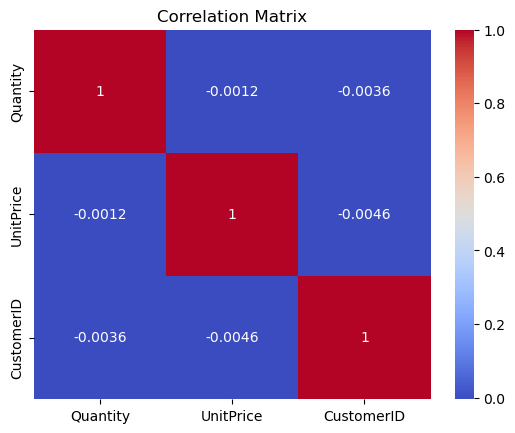

In [15]:
#Correlation matrix
correlation_matrix=df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

2.Data Preprocessing


Convert the 'InvoiceDate' columns to date-time format

In [16]:
# Convert 'InvoiceDate' to datetime format
#df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

Aggregate sales data on a monthly basis. Aggregating data on a montly basis helps in understanding montly sales trends and patterns.

In [19]:
#Extract month and year from 'UnvoiceDate'
df['Month']= df['InvoiceDate'].dt.month
df['Year'] = df['InvoiceDate'].dt.year

#Agregate sales data by month
monthly_sales_data=df.groupby(['Year','Month']).agg({'UnitPrice': 'sum', 'Quantity':'sum'}).reset_index()

In [20]:
monthly_sales_data

,Year,Month,UnitPrice,Quantity
0,2010,12,260520.850,342228
1,2011,1,172752.800,308966
2,2011,2,127448.770,277989
3,2011,3,171486.510,351872
4,2011,4,129164.961,289098
5,2011,5,190685.460,380391
6,2011,6,200717.340,341623
7,2011,7,171906.791,391116
8,2011,8,150385.680,406199
9,2011,9,199235.212,549817


Create new features. Creating new features can provide additional insights. Here, we're calculating the total sales for each order

In [21]:
#Create 'Total Sales' feature

df['Total Sales']=df['Quantity']*df['UnitPrice']

In [22]:
df['Total Sales']

0         15.30
1         20.34
2         22.00
3         20.34
4         20.34
          ...  
541904    10.20
541905    12.60
541906    16.60
541907    16.60
541908    14.85
Name: Total Sales, Length: 541909, dtype: float64

# Data Analysis

Plot the aggregated sales data over time to visualize the trend

Visualizing aggregated sales over time helps in identifying trends, seasonality, and any anomalies in te data.

In [24]:
#Using Plotly for interactive visualization
fig4=go.Figure(data=go.Scatter(x=pd.to_datetime(monthly_sales_data['Year'].astype(str)+'-' + monthly_sales_data['Month'].astype(str)+'-01'),
                              y=monthly_sales_data['UnitPrice'],
                              mode='lines+markers'))

fig4.update_layout(title='Aggregated Montly Sales Over Time',
                  xaxis_title='Time',
                  yaxis_title='Total Sales',
                  xaxis = dict(showgrid=True, showline=True, showticklabels=True),
                  yaxis =dict(showgrid=True, showline=True, showticklabels=True))

fig4.show()

Identify significant seasonality or cyclical patterns in sales data

Decomposing the time series data helps in understanding its underlying patterns like trend, seasonality, and residuals.

What is Seasonal Decomposition?
Seasonal decomposition is a technique used to separate a time series into its different components: trend, seasonality, and residual. The trend component represents the long-term pattern or direction of the data, while the seasonality component captures the repeating patterns within a specific time period. The residual component represents the random fluctuations or noise in the data.

By decomposing a time series into its components, we can better understand the underlying patterns and make more accurate forecasts. This is particularly useful when dealing with data that exhibits strong seasonality.

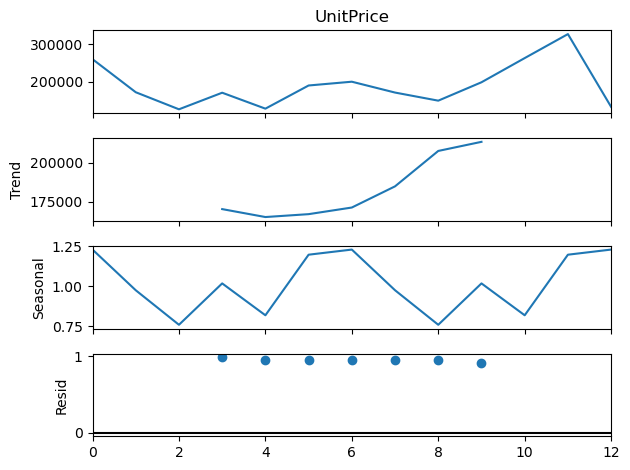

In [27]:
#Using seasonal decomposition to identify patterns
from statsmodels.tsa.seasonal import seasonal_decompose

#Decompose the time series data with a bi-monthly period
result=seasonal_decompose(monthly_sales_data['UnitPrice'], model='multiplicative', period=6)

#Plot the decomposed componets
result.plot()
plt.show()

Use statistical methods to identify peak and low sales periods

Identify peak and low sales periods can guide marketing and promotional strategies.

In [30]:
#identify months with peak sales
peak_sales=monthly_sales_data[monthly_sales_data['UnitPrice']==monthly_sales_data['UnitPrice'].max()]

#Identify months with lowest sales
low_sales=monthly_sales_data[monthly_sales_data['UnitPrice']==monthly_sales_data['UnitPrice'].min()]

print(f"Peak Sales were in: {peak_sales['Month'].values[0]}, {peak_sales['Year'].values[0]}")

print(f"Lowest Sales were in: {low_sales['Month'].values[0]}, {low_sales['Year'].values[0]}")


Peak Sales were in: 11, 2011
Lowest Sales were in: 2, 2011


Monthly Sales Growth Rate. This visualization will help in understanding the dynamics of sales growth and identifying periods of rapid growth or decline.

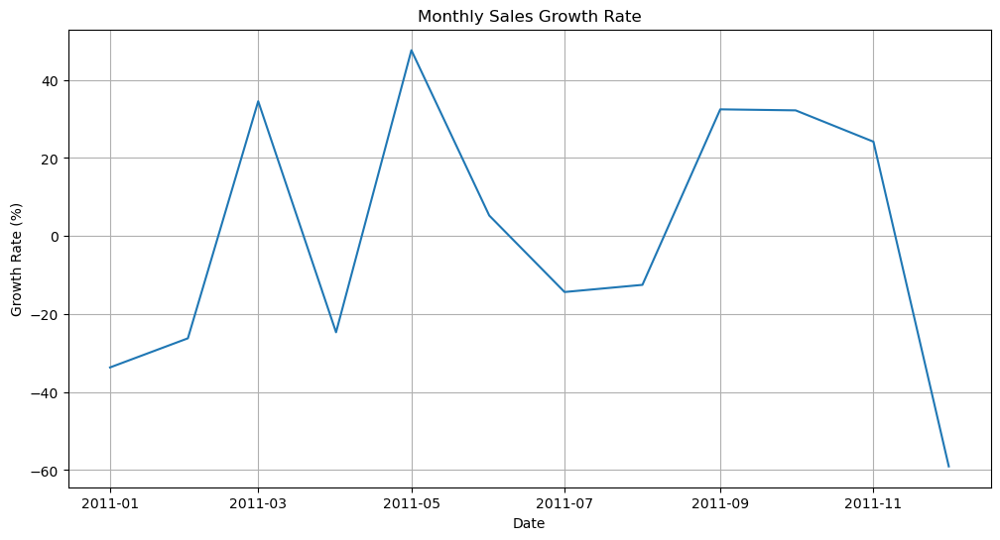

In [31]:
#Calculate the month-over-month growth rate
monthly_sales_data['Sales Growth'] = monthly_sales_data['UnitPrice'].pct_change()*100

#Plotting the growth rate
plt.figure(figsize=(12,6))
sns.lineplot(x=pd.to_datetime(monthly_sales_data['Year'].astype(str) + '-' + monthly_sales_data['Month'].astype(str)+ '-01'),
            y='Sales Growth', data=monthly_sales_data)

plt.title('Monthly Sales Growth Rate')
plt.ylabel('Growth Rate (%)')
plt.xlabel('Date')
plt.grid(True)
plt.show()

Product-wise Sales. Understanding which products are the best-seller can guide inventory decisions and marketing strategies.

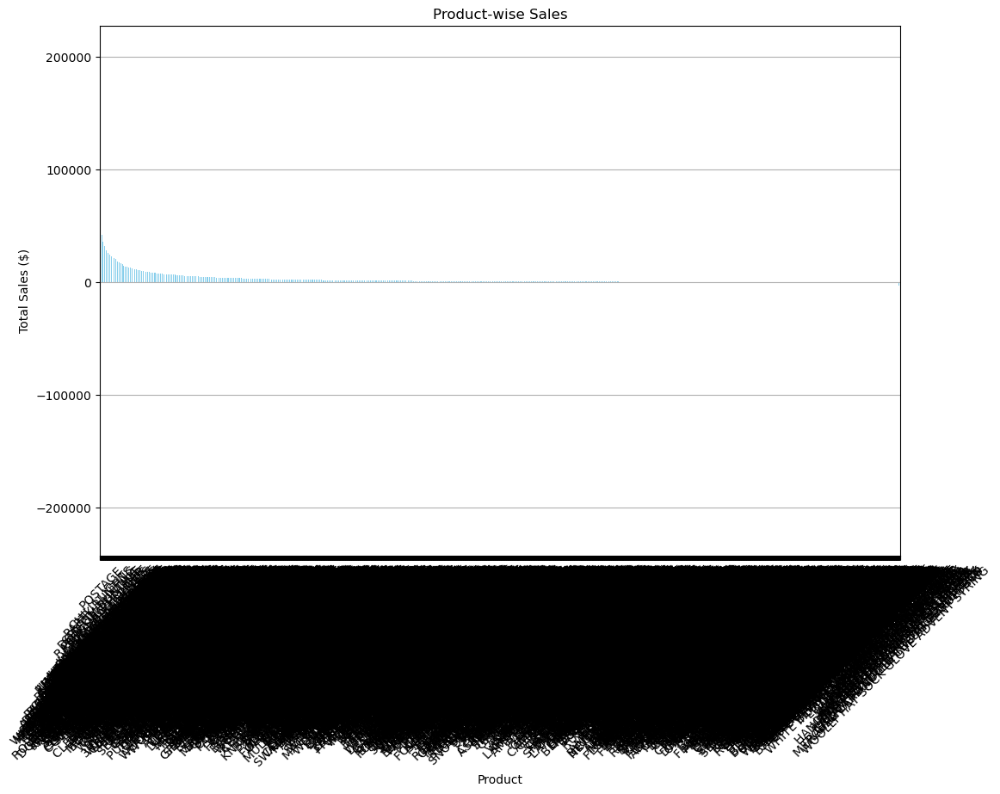

In [35]:
#Calculate total sales for each product
product_sales = df.groupby('Description')['Total Sales'].sum().sort_values(ascending=False)

#Plotting product-wise sales
plt.figure(figsize=(12,8))
product_sales.plot(kind='bar', color='skyblue')
plt.title('Product-wise Sales')
plt.ylabel('Total Sales ($)')
plt.xlabel('Product')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Sales by Category. Sales distribution across different categories can provide insights into which categories are most popular and deserve more attention.

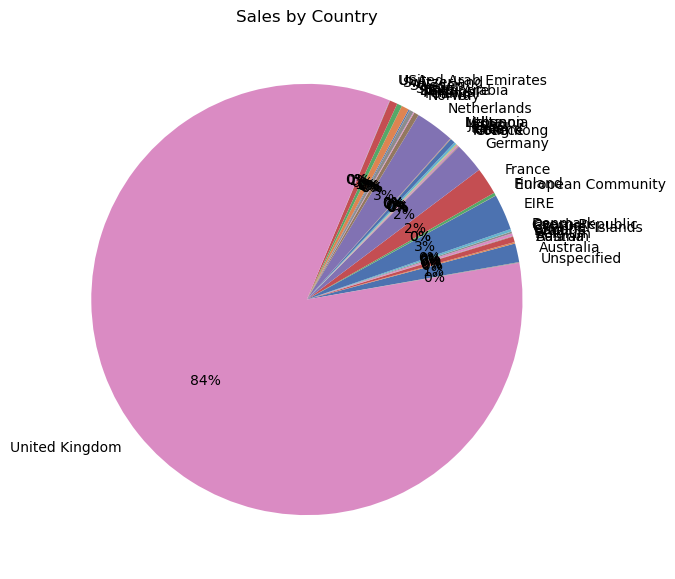

In [62]:
#Calculate total sales for each category
country_sales= df.groupby('Country')['Total Sales'].sum()
labels = df.keys()
#Plotting sales by category
plt.figure(figsize=(10,7))
country_sales.plot(kind='pie', autopct='%0.0f%%', startangle=10, colors=sns.color_palette('deep'))
plt.title('Sales by Country')
plt.ylabel('')
plt.show()

Day-wise Sales Distribution. Identiying peak sales days can help optimizing promotions and marketing efforts for specific days of the week.

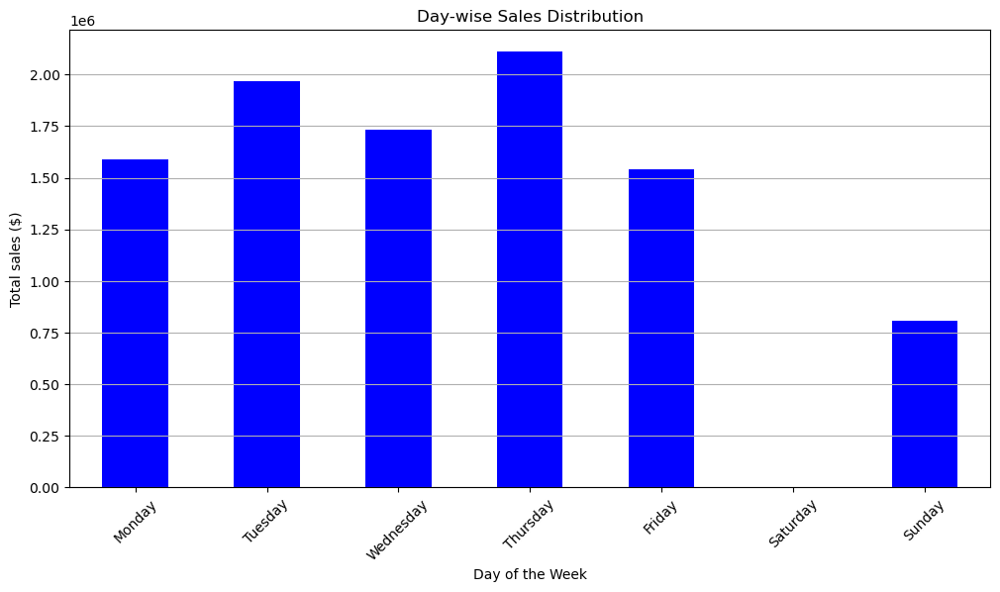

In [63]:
#Extract day of the week from 'InvoiceDate'
df['Day of Week']=df['InvoiceDate'].dt.day_name()

#Calculate total sales for each day of the week
day_sales = df.groupby('Day of Week')['Total Sales'].sum().reindex(['Monday', 'Tuesday', 'Wednesday', 'Thursday','Friday','Saturday',
                                                                   'Sunday'])
#Plotting day-wise  sales distribution
plt.figure(figsize=(12,6))
day_sales.plot(kind='bar', color='blue')
plt.title('Day-wise Sales Distribution')
plt.ylabel('Total sales ($)')
plt.xlabel('Day of the Week')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

Interpretation and Communication. Summarizing the main findings from the analysis. From our analysis, we can derive the following key insights.

From our analysis, we can derive the following key insights:

The dataset is comprehensive, covering a wide range of products, with no missing values ensuring a reliable analysis.
There’s a noticeable seasonality in the sales data, suggesting potential holiday or promotional sales.
The correlation matrix no indicates relationships between numerical variables, but further analysis might be needed to derive actionable insights.

Visual Representations of Sales Trends
A heatmap provides a visual representation of monthly sales over the years, helping in identifying patterns and trends.

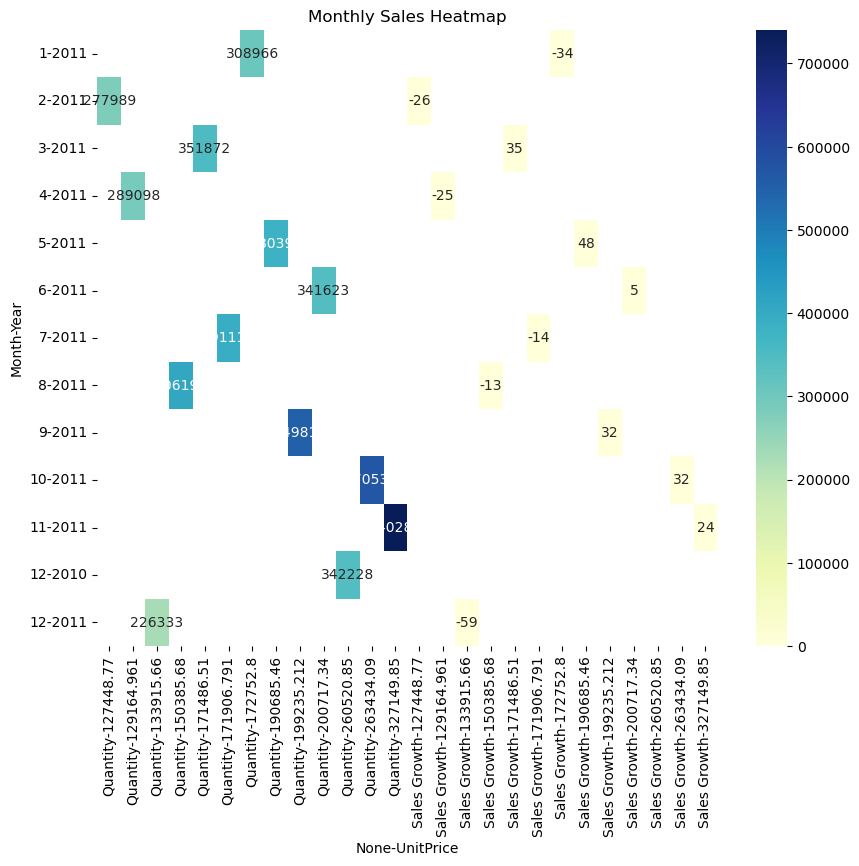

In [45]:
import seaborn as sns

# Pivot the data to get months on one axis and years on another axis
heatmap_data = monthly_sales_data.pivot(index=["Month", "Year"], columns="UnitPrice")

plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".0f")
plt.title('Monthly Sales Heatmap')
plt.show()